# Week 4

In [1]:
# Own Libraries
from utils.plotting import plot_image_and_similar
from utils.data import DataManager
from utils.metrics import prec_recall, iou_score, f1_dice
from utils.denoising import denoise_images
from utils.similarity import Similarity
from utils.image_processing import image_to_windows, get_3d_norm_histogram, calculate_histograms,text_removal
from utils.image_processing import calculate_histograms, text_removal, calculate_hog, calculate_lbp
from utils.segbackground import NMS, background_crop,iou_score
# 3rd Party Libraries
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.restoration import estimate_sigma
from scipy.ndimage import gaussian_filter
from typing import Tuple, List
from tqdm import tqdm
import numpy as np
import matplotlib.pyplot as plt
import ml_metrics as metrics
import cv2
import os
import pickle
import math

In [2]:
def readimg (path):
    return cv2.cvtColor(cv2.imread(path), cv2.COLOR_BGR2RGB)

def estimate_noise(img):
    return estimate_sigma(img, multichannel=True, average_sigmas=True)

# Load Data

In [3]:
!ls data/qsd1_w4

00000.jpg  00005.png  00010.txt  00016.jpg  00021.png  00026.txt
00000.png  00005.txt  00011.jpg  00016.png  00021.txt  00027.jpg
00000.txt  00006.jpg  00011.png  00016.txt  00022.jpg  00027.png
00001.jpg  00006.png  00011.txt  00017.jpg  00022.png  00027.txt
00001.png  00006.txt  00012.jpg  00017.png  00022.txt  00028.jpg
00001.txt  00007.jpg  00012.png  00017.txt  00023.jpg  00028.png
00002.jpg  00007.png  00012.txt  00018.jpg  00023.png  00028.txt
00002.png  00007.txt  00013.jpg  00018.png  00023.txt  00029.jpg
00002.txt  00008.jpg  00013.png  00018.txt  00024.jpg  00029.png
00003.jpg  00008.png  00013.txt  00019.jpg  00024.png  00029.txt
00003.png  00008.txt  00014.jpg  00019.png  00024.txt  frames.pkl
00003.txt  00009.jpg  00014.png  00019.txt  00025.jpg  gt_corresps.pkl
00004.jpg  00009.png  00014.txt  00020.jpg  00025.png  text_boxes.pkl
00004.png  00009.txt  00015.jpg  00020.png  00025.txt
00004.txt  00010.jpg  00015.png  00020.txt  00026.jpg
00005.jpg  00010.png  00015.txt  00

In [4]:
!ls data/qst1_w4

00000.jpg  00008.jpg  00016.jpg  00024.jpg  00032.jpg  00040.jpg  00048.jpg
00001.jpg  00009.jpg  00017.jpg  00025.jpg  00033.jpg  00041.jpg  00049.jpg
00002.jpg  00010.jpg  00018.jpg  00026.jpg  00034.jpg  00042.jpg
00003.jpg  00011.jpg  00019.jpg  00027.jpg  00035.jpg  00043.jpg
00004.jpg  00012.jpg  00020.jpg  00028.jpg  00036.jpg  00044.jpg
00005.jpg  00013.jpg  00021.jpg  00029.jpg  00037.jpg  00045.jpg
00006.jpg  00014.jpg  00022.jpg  00030.jpg  00038.jpg  00046.jpg
00007.jpg  00015.jpg  00023.jpg  00031.jpg  00039.jpg  00047.jpg


In [5]:
# Load Data
data_manager = DataManager()
db, db_files = data_manager.load_data(folder = "./data/BBDD/", extension = ".jpg", desc = "Loading BBDD Data...")

qsd1_w4, qsd1_w4_files = data_manager.load_data(folder = "./data/qsd1_w4/", extension = ".jpg", desc = "Loading qsd1_w4 Data...")
qst1_w4, qst1_w4_files = data_manager.load_data(folder = "./data/qst1_w4/", extension = ".jpg", desc = "Loading qst1_w4 Data...")

Loading BBDD Data...: 100%|███████████████████| 287/287 [00:05<00:00, 52.77it/s]


./data/BBDD/ read: 287 images


Loading qsd1_w4 Data...: 100%|█████████████████| 30/30 [00:00<00:00, 109.40it/s]


./data/qsd1_w4/ read: 30 images


Loading qst1_w4 Data...: 100%|██████████████████| 50/50 [00:00<00:00, 62.76it/s]


./data/qst1_w4/ read: 50 images


This week we use mainly:
- QSD1-W4 (30) / QST1-W4 (50)  pictures with background, with overlapping text (name of painter), one, two or three paintings per image, some paintings with noise, some paintings with changes in color, some paintings not in database

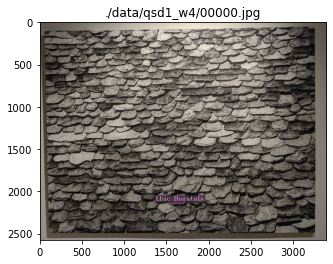

In [6]:
for img, filename in zip(qsd1_w4, qsd1_w4_files):
    plt.imshow(img)
    plt.title(filename)
    break # show only 1 image

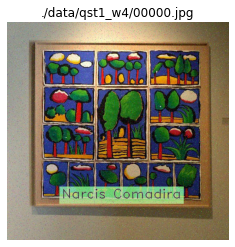

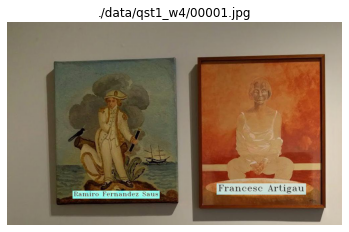

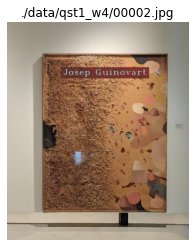

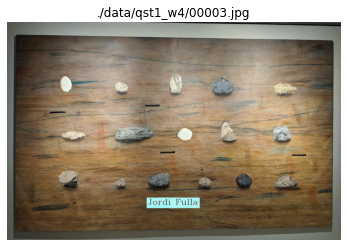

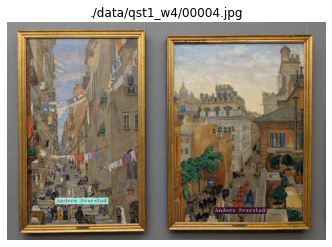

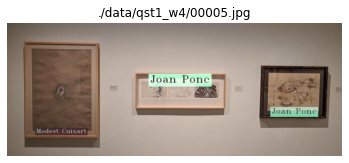

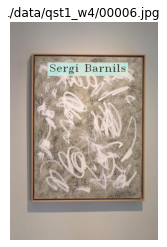

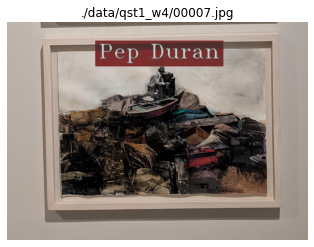

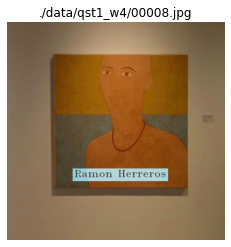

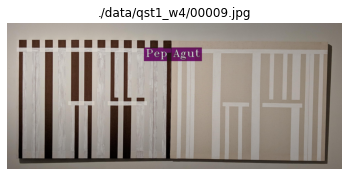

In [7]:
for img, filename in zip(qst1_w4[:10], qst1_w4_files[:10]):
    plt.imshow(img)
    plt.title(filename)
    plt.axis('off')
    plt.show()

## Preprocessing: Noise Reduction

In [8]:
DENOISE = True

if DENOISE: 
    qsd1_w4 = denoise_images(qsd1_w4, method='nlmeans', ksize=(3,3))
    qst1_w4 = denoise_images(qst1_w4, method='nlmeans', ksize=(3,3))

100%|███████████████████████████████████████████| 50/50 [01:40<00:00,  2.00s/it]


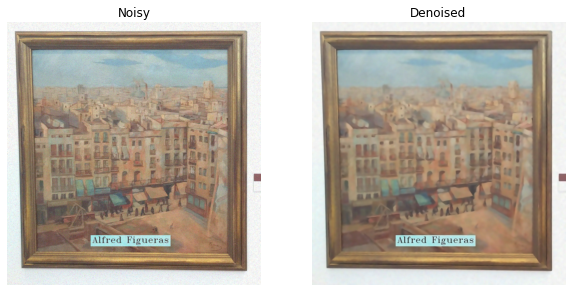

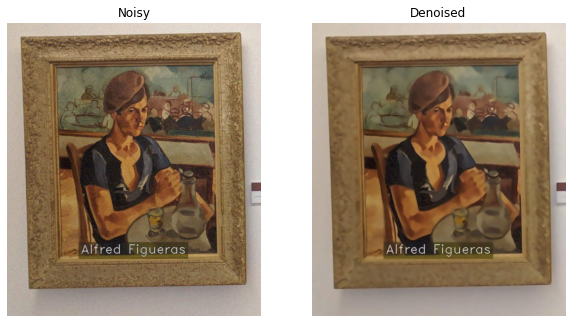

In [9]:
for den_img, filename in zip(qsd1_w4[1:3], qsd1_w4_files[1:3]):
    
    img = readimg(filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(img)
    axarr[0].title.set_text("Noisy")
    axarr[0].axis('off')
    axarr[1].imshow(den_img)
    axarr[1].title.set_text("Denoised")
    axarr[1].axis('off')
    plt.show()

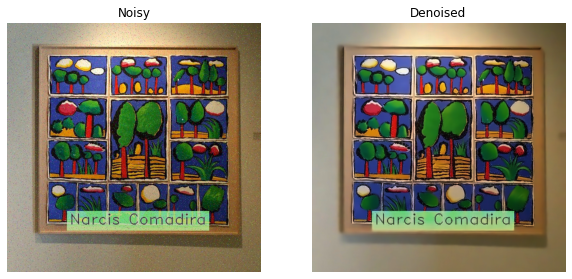

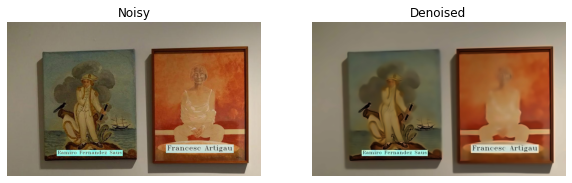

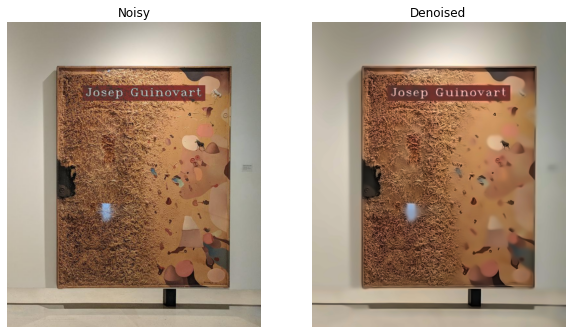

In [10]:
for den_img, filename in zip(qst1_w4[:3], qst1_w4_files[:3]):
    
    img = readimg(filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(img)
    axarr[0].title.set_text("Noisy")
    axarr[0].axis('off')
    axarr[1].imshow(den_img)
    axarr[1].title.set_text("Denoised")
    axarr[1].axis('off')
    plt.show()

## Step 1) Crop, background removal and obtain the pictures.

In [11]:
DO_BKGCROP = True

In [13]:
def background_crop (files, gt_masks= True, save_masks = False, plot_results=True, plot_rect=False):
    
    SCORES = []
    PREDICTIONS = {}
    RESULT = []
    FILENAMES = []

    for file in files:

        base = readimg (file)
        if gt_masks:
            gt_mask = readimg (file.replace('.jpg', '.png'))

        base_rgb = base.copy()
        rgb = base.copy()
        
        base = cv2.cvtColor(base, cv2.COLOR_BGR2GRAY)
        gray = base.copy()

        # Performing OTSU threshold
        
        _, base = cv2.threshold(base, 0, 255, cv2.THRESH_OTSU | cv2.THRESH_BINARY_INV)
        kernel = np.array([[-1,-1,-1], [-1,10,-1], [-1,-1,-1]])
        base = cv2.filter2D(base, -1, kernel)
        
        if base.shape[1]/base.shape[0] > 1.55: 
            # landscape images = multiple pictures
            _, base_inv = cv2.threshold(base, 0, 255, cv2.THRESH_OTSU)
            base_inv = cv2.filter2D(base_inv, -1, kernel)
            #print (base.shape[1]/base.shape[0], base.shape)            

        # Morphology mask
        mask = base
        
        # opening 1) correct noise
        mask = cv2.erode(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)), iterations = 1)
        mask = cv2.dilate(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)), iterations = 1)
        
        # closing 1) get shapes
        mask = cv2.dilate(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (11, 11)), iterations = 1)
        mask = cv2.erode(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (11, 11)), iterations = 1)
        # closing 2) get shapes
        mask = cv2.dilate(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)), iterations = 1)
        mask = cv2.erode(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (5, 5)), iterations = 1)
        
        # opening -> closing define better edges
        mask = cv2.erode(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)), iterations = 1)
        mask = cv2.dilate(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)), iterations = 1)
        mask = cv2.dilate(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)), iterations = 1)
        mask = cv2.erode(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3)), iterations = 1)
        
        mask = cv2.filter2D(mask, -1, kernel)
        mask = ((mask - 255)*(-1)).astype(np.uint8)
        
        #if base.shape[1]/base.shape[0] > 1.55: 
            #print (mask.dtype, mask.min(), mask.max())
            #mask = cv2.dilate(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (13, 13)), iterations = 1)
            #mask = cv2.erode(mask, cv2.getStructuringElement(cv2.MORPH_RECT, (13, 13)), iterations = 1)
        
        # Finding contours
        
        contours_mask, _ = cv2.findContours(mask, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        contours_base, _ = cv2.findContours(base, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
        contours = contours_mask + contours_base
        assert len(contours) == len(contours_base)+len(contours_mask)
            
        if base.shape[1]/base.shape[0] > 1.55: 
            contours_base_inv, _ = cv2.findContours(base_inv, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_NONE)
            contours = contours_mask + contours_base + contours_base_inv
           
        boxes = []
        areas = []
        
        for cnt in contours:
            
            x, y, w, h = cv2.boundingRect(cnt)
            cropped = base_rgb[y:y + h, x:x + w]
            area_cropped = cropped.shape[0] * cropped.shape[1]
            
            cond1 = (cropped.shape[1] >= int(rgb.shape[1]*0.9)) and (cropped.shape[0] <= int(rgb.shape[0]*0.25))
            cond2 = (base.shape[1]/base.shape[0] > 1.55)
            cond3 = cond2 and ((cropped.shape[0]*cropped.shape[1]) >= 0.9 * (rgb.shape[0]*rgb.shape[1]))
            
            if (area_cropped <= 200*200) or (cropped.shape[0] < 200) or (cropped.shape[1] < 200) or cond3: 
                continue
            elif cond1 and not(cond2):
                aux_box = (0, 0, 0 + rgb.shape[1], 0 + rgb.shape[0])
                cropped = base_rgb[0:0 + rgb.shape[1], 0:0 + rgb.shape[0]]
                area_cropped = cropped.shape[0] * cropped.shape[1]
            
                boxes.append(aux_box)
                areas.append((area_cropped, aux_box))
                
            else: 
                boxes.append((x, y, x + w, y + h))
                areas.append((area_cropped, (x, y, x + w, y + h)))
                #areas[area_cropped] = (x, y, x + w, y + h)
        
        
        if not(cond2): 
            boxes = NMS(np.array(boxes), overlapThresh = 0.5)

        # Produce mask
        morph_mask = mask.copy()
        mask = np.zeros(base_rgb.shape)
        
        contours_detect = len(boxes)
        #print ('contours detected:', len(boxes))
        
        if contours_detect > 20:
            # outlier due to weird texture images
            contours_detect = 1
            x, y, x2, y2 = (0, 0, 0 + rgb.shape[1], 0 + rgb.shape[0])
            cropped = base_rgb[y:y2, x:x2]
            mask [y:y2, x:x2] = 1
            if plot_rect:
                rect = cv2.rectangle(base_rgb, (x, y), (x2, y2), (0, 255, 0), 10)
                
            PREDICTIONS[file] = boxes[0]
            RESULT.append(cropped)
            FILENAMES.append(file)
            
        elif contours_detect > 1:
            # 3 biggest boxes
            
            # remove possible duplicates in the lists
            areas = list(set(areas))
            #assert len(areas) == contours_detect
            #print (areas)
            #print ([x[0] for x in areas])
            #big = areas.sort(key=lambda x:x[0])
            areas = sorted(areas, key=lambda tup: tup[0], reverse=True)
            
            if len(areas) == 1:
                box1   = areas[0][1]
                nboxes = [box1]
            else:
                box1   = areas[0][1]
                box2   = areas[1][1]
                nboxes = [box1, box2]
            
            contours_detect = len(nboxes)
            
            PREDICTIONS[file] = nboxes
            for box in nboxes:
                x, y, x2, y2 = box
                cropped = base_rgb[y:y2, x:x2]
                mask [y:y2, x:x2] = 1
                if plot_rect:
                    rect = cv2.rectangle(base_rgb, (x, y), (x2, y2), (0, 255, 0), 10)
                    
                #plt.imshow(cropped)
                #plt.axis('off')
                #plt.show()
                RESULT.append(cropped)
                FILENAMES.append(file)
                
        elif contours_detect == 1:
            
            x, y, x2, y2 = boxes[0]
            cropped = base_rgb[y:y2, x:x2]
            mask [y:y2, x:x2] = 1
            #print (x, y, x2, y2)
            if plot_rect:
                rect = cv2.rectangle(base_rgb, (x, y), (x2, y2), (0, 255, 0), 10)
                
            PREDICTIONS[file] = boxes[0]
            RESULT.append(cropped)
            FILENAMES.append(file)
            #plt.imshow(rect)
            #plt.axis('off')
            #plt.show()
            #plt.imshow(cropped)
            #plt.axis('off')
            #plt.show()
            
        else:
            contours_detect = 1
            x, y, x2, y2 = (0, 0, 0 + rgb.shape[1], 0 + rgb.shape[0])
            cropped = base_rgb[y:y2, x:x2]
            mask [y:y2, x:x2] = 1
            #print (x, y, x2, y2)
            if plot_rect:
                rect = cv2.rectangle(base_rgb, (x, y), (x2, y2), (0, 255, 0), 10)
                
            PREDICTIONS[file] = (0, 0, 0 + rgb.shape[1], 0 + rgb.shape[0])
            RESULT.append(cropped)
            FILENAMES.append(file)
            
            
        mask = mask.astype(np.uint8) * 255

        try: 
            mask_iou = iou_score(gt_mask, mask)
        except:
            mask_iou = 0.75
        
        SCORES.append(mask_iou)
        
        if plot_results:
            
            assert contours_detect <= 2
 
            f, axarr = plt.subplots(1,6, figsize=(15,15))
            axarr[0].imshow(rgb)
            axarr[0].title.set_text("RGB")
            axarr[0].axis('off')
            axarr[1].imshow(base, cmap="gray")
            axarr[1].title.set_text("Otsu's Binarized")
            axarr[1].axis('off')
            axarr[2].imshow(morph_mask, cmap="gray")
            axarr[2].title.set_text(f"Morphology Mask {contours_detect}")
            axarr[2].axis('off')
            axarr[3].imshow(mask, cmap="gray")
            axarr[3].title.set_text(f"Final Mask {np.round(mask_iou,2)} iou")
            axarr[3].axis('off')
            if gt_masks: 
                axarr[4].imshow(gt_mask, cmap="gray")
            else:
                axarr[4].imshow(mask, cmap="gray")
            axarr[4].title.set_text("GT Mask")
            axarr[4].axis('off')
            axarr[5].imshow(base_rgb)
            axarr[5].title.set_text("RGB")
            axarr[5].axis('off')
            plt.show()
    
    if gt_masks:
        print ('\n>> Mean IOU Score: ', np.mean(SCORES))
        
    assert len(RESULT) == len(FILENAMES)
    return RESULT, FILENAMES

In [14]:
new_qsd1_w4, new_qsd1_w4_files = background_crop (files= qsd1_w4_files, gt_masks= True,  save_masks = False, plot_results=False, plot_rect=False)


>> Mean IOU Score:  0.8159118700921294


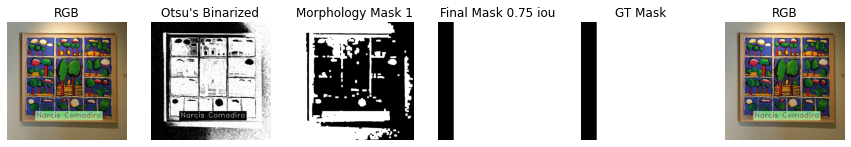

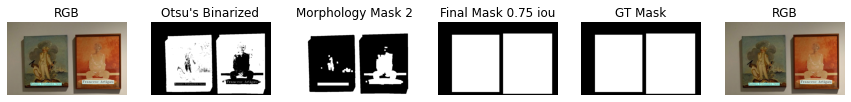

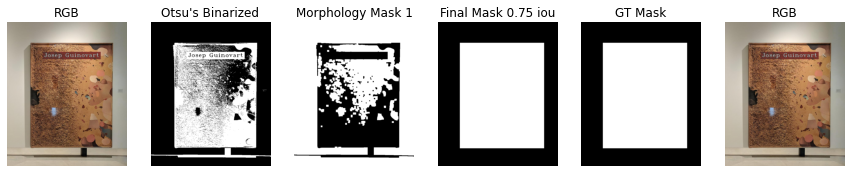

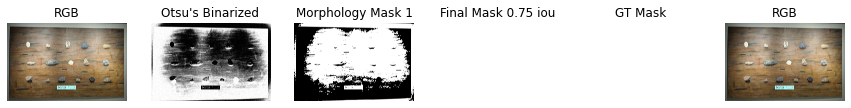

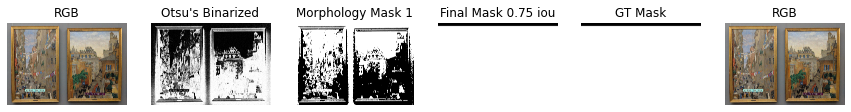

...

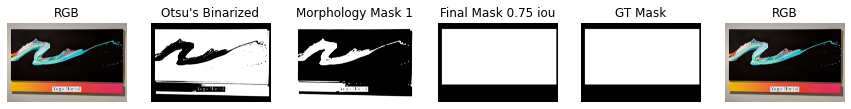

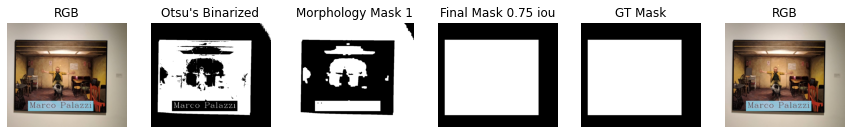

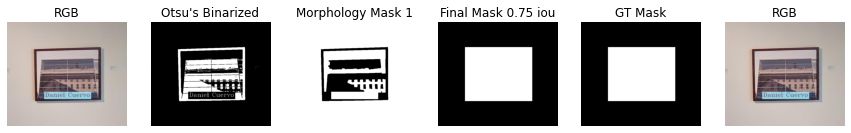

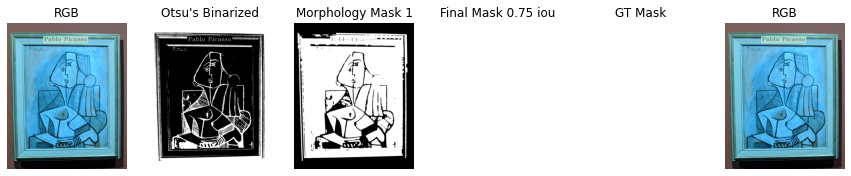

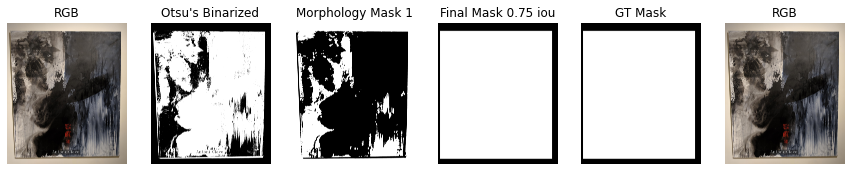

In [15]:
#new_qst1_w4, new_qst1_w4_files = background_crop (files= qst1_w4_files, gt_masks= False,  save_masks = False, plot_results=True, plot_rect=True)
new_qst1_w4, new_qst1_w4_files = background_crop (files= qst1_w4_files, gt_masks= False,  save_masks = False, plot_results=True, plot_rect=False)

In [16]:
set(new_qsd1_w4_files) == set(qsd1_w4_files)

True

In [17]:
len(new_qsd1_w4_files), len(qsd1_w4_files), len(new_qst1_w4_files), len(qst1_w4_files)

(35, 30, 58, 50)

In [19]:
len(qsd1_w4_files), len(qst1_w4_files)

(35, 58)

In [18]:
if DO_BKGCROP: 
    qsd1_w4, qsd1_w4_files = new_qsd1_w4, new_qsd1_w4_files
    qst1_w4, qst1_w4_files = new_qst1_w4, new_qst1_w4_files
    
    qsd1_w4 = denoise_images(qsd1_w4,method='median', ksize=(3,3))
    qst1_w4 = denoise_images(qst1_w4,method='median', ksize=(3,3))

100%|██████████████████████████████████████████| 58/58 [00:00<00:00, 525.28it/s]


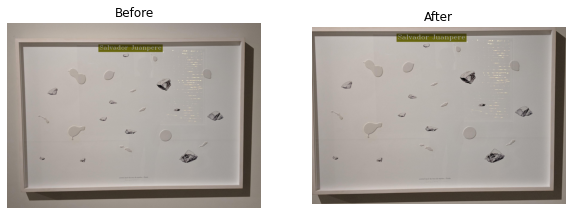

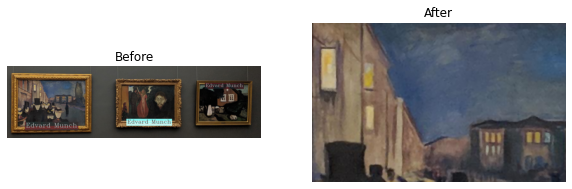

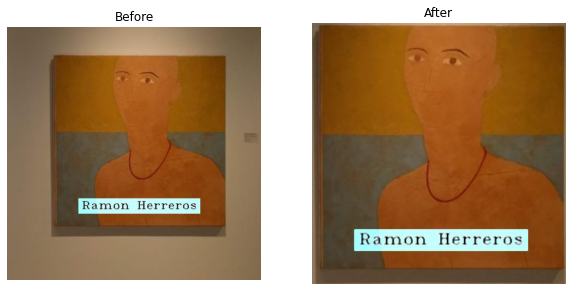

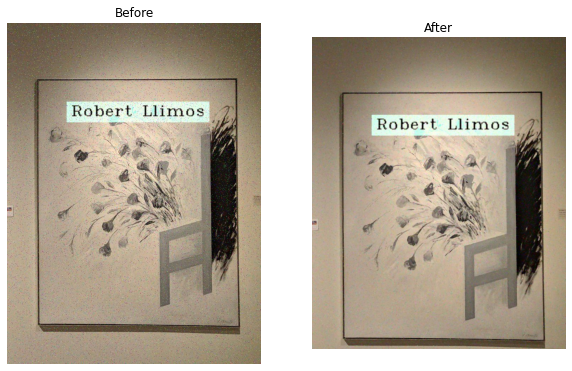

In [20]:
for img, filename in zip(qsd1_w4[4:8], qsd1_w4_files[4:8]):
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[0].axis('off')
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    axarr[1].axis('off')
    plt.show()

In [21]:
len(qst1_w4_files)

58

./data/qst1_w4/00000.jpg


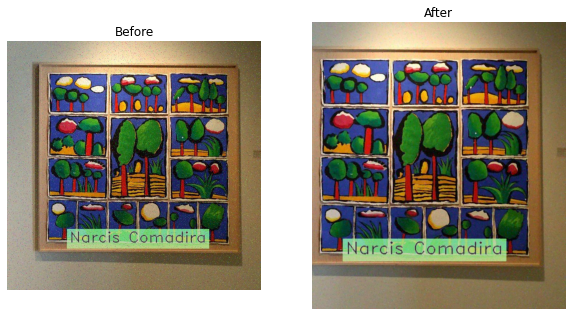

./data/qst1_w4/00001.jpg


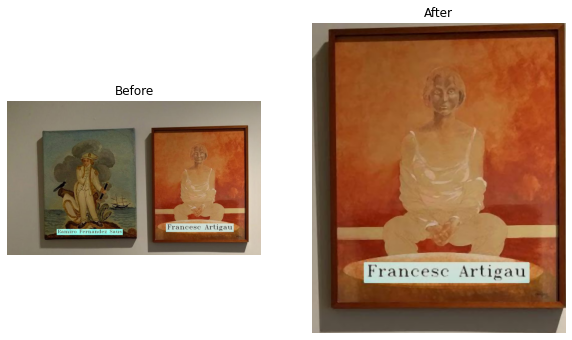

./data/qst1_w4/00001.jpg


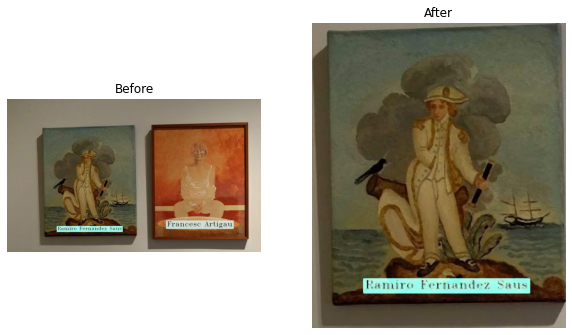

./data/qst1_w4/00002.jpg


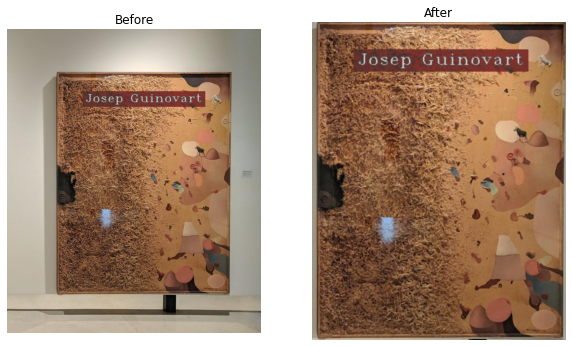

In [22]:
for img, filename in zip(qst1_w4[:4], qst1_w4_files[:4]):
    
    print (filename)
    
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[0].axis('off')
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    axarr[1].axis('off')
    plt.show()

## Step 2) Text Removal using crops

In [23]:
DO_TEXT_REMOVAL = False

In [24]:
#Method to remove text from the image with a rectangle 0 mask
if DO_TEXT_REMOVAL:
    qsd1_w4,contours = text_removal(qsd1_w4,num_images= 1, method='better', desc = 'Removing text of images') 

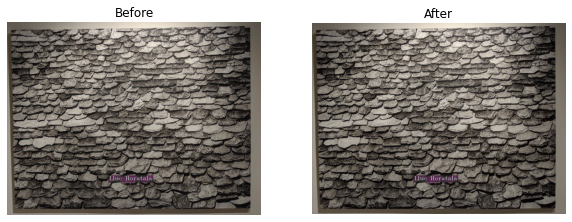

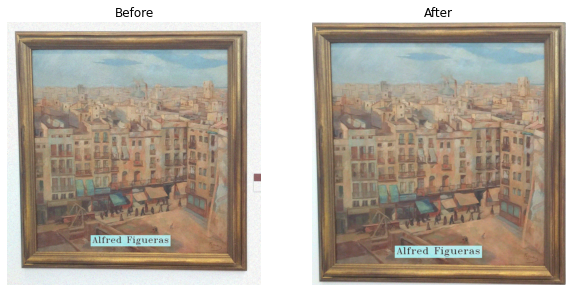

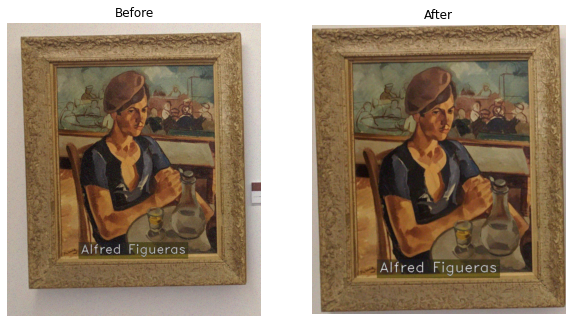

In [25]:
for img, filename in zip(qsd1_w4[:3], qsd1_w4_files[:3]):
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[0].axis('off')
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    axarr[1].axis('off')
    plt.show()

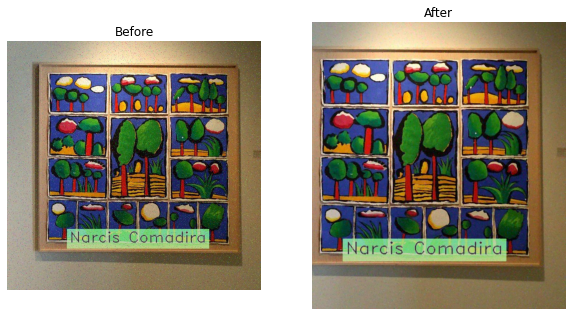

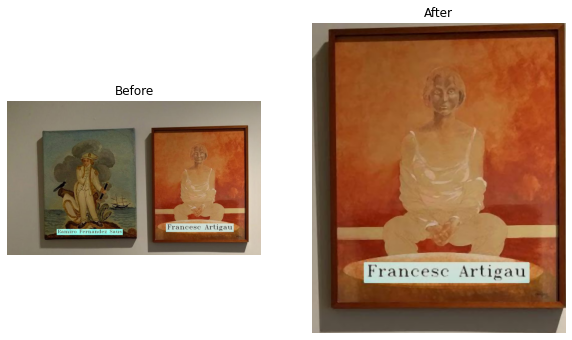

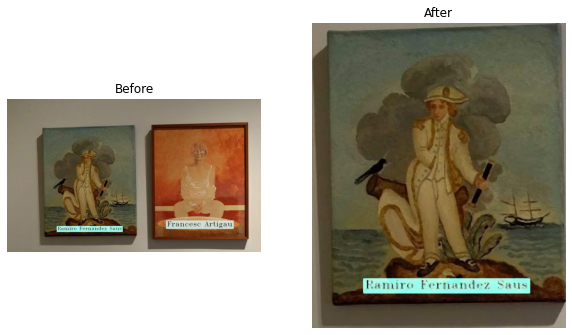

In [26]:
for img, filename in zip(qst1_w4[:3], qst1_w4_files[:3]):
    base = readimg (filename)
    
    f, axarr = plt.subplots(1,2, figsize=(10,10))
    axarr[0].imshow(base)
    axarr[0].title.set_text("Before")
    axarr[0].axis('off')
    axarr[1].imshow(img)
    axarr[1].title.set_text("After")
    axarr[1].axis('off')
    plt.show()

## Step 3) Feature extraction

In [27]:
NBINS = 16
NCOLS = 8
NROWS = 8
BLOCK = True

In [28]:
# 3D Normalized Histograms Multiresolutio/Block Images and Hog

db_color_matrix = calculate_histograms(data = db, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc="Normalized 3D Histograms Calculation for BBDD...")
qsd1_w4_color_matrix = calculate_histograms(data = qsd1_w4, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc = "Normalized 3D Histograms Calculation for qs1_w4...")

db_texture_matrix = calculate_hog(data = db, desc="Histogram of Gradient (HoG) for BBDD...")
qsd1_w4_texture_matrix = calculate_hog(data = qsd1_w4, desc = "Histogram of Gradient (HoG) for qsd1_w2...")

qst1_w4_color_matrix   = calculate_histograms(data = qst1_w4, n_bins = NBINS, n_rows=NROWS, n_cols=NCOLS, desc = "Normalized 3D Histograms Calculation for qs1_w4...")
qst1_w4_texture_matrix = calculate_hog(data = qst1_w4, desc = "Histogram of Gradient (HoG) for qsd1_w2...")

Normalized 3D Histograms Calculation for BBDD...: 100%|█| 287/287 [00:01<00:00, 
Normalized 3D Histograms Calculation for qs1_w4...: 100%|█| 35/35 [00:00<00:00, 
Histogram of Gradient (HoG) for BBDD...: 100%|█| 287/287 [00:17<00:00, 16.53it/s
Histogram of Gradient (HoG) for qsd1_w2...: 100%|█| 35/35 [00:00<00:00, 124.95it
Normalized 3D Histograms Calculation for qs1_w4...: 100%|█| 58/58 [00:00<00:00, 
Histogram of Gradient (HoG) for qsd1_w2...: 100%|█| 58/58 [00:01<00:00, 51.66it/


In [29]:
print (f'For each of the {qsd1_w4_texture_matrix.shape[0]} images, we have a {qsd1_w4_texture_matrix.shape[1]} dimensional texture descriptor')
print (f'For each of the {qsd1_w4_color_matrix.shape[0]} images, we have a {qsd1_w4_color_matrix.shape[1]} dimensional color descriptor')

For each of the 35 images, we have a 300 dimensional texture descriptor
For each of the 35 images, we have a 262144 dimensional color descriptor


In [30]:
# Similarity
sim = Similarity()
qs1_w4_similarities_color    = sim.compute_similarities(qs = qsd1_w4_color_matrix, db_feature_matrix = db_color_matrix, desc = "Computing qs1_w4 similarities...", similarity = 'hellinger')
qs1_w4_similarities_texture  = sim.compute_similarities(qs = qsd1_w4_texture_matrix, db_feature_matrix = db_texture_matrix, desc = "Computing qs1_w4 similarities...", similarity = 'hellinger')

qt1_w4_similarities_color    = sim.compute_similarities(qs = qst1_w4_color_matrix, db_feature_matrix = db_color_matrix, desc = "Computing qs1_w4 similarities...", similarity = 'hellinger')
qt1_w4_similarities_texture  = sim.compute_similarities(qs = qst1_w4_texture_matrix, db_feature_matrix = db_texture_matrix, desc = "Computing qs1_w4 similarities...", similarity = 'hellinger')

alpha = 0.3
beta  = 0.7

qs1_w4_sim_combine = qs1_w4_similarities_color*alpha + qs1_w4_similarities_texture*beta
qt1_w4_sim_combine = qt1_w4_similarities_color*alpha + qt1_w4_similarities_texture*beta

Computing qs1_w4 similarities...: 100%|█████████| 58/58 [00:01<00:00, 50.46it/s]


In [31]:
# Get top K
K = 10

top_k_qs1_w4_color   = sim.get_top_k(similarity_matrix = qs1_w4_similarities_color, db_files = db_files, k=K, desc="Retrieving qs1_w4 top K similar images...")
top_k_qs1_w4_texture = sim.get_top_k(similarity_matrix = qs1_w4_similarities_texture, db_files = db_files, k=K, desc="Retrieving qs1_w4 top K similar images...")
top_k_qs1_w4_combine = sim.get_top_k(similarity_matrix = qs1_w4_sim_combine, db_files = db_files, k=K, desc="Retrieving qs1_w4 top K similar images...")

top_k_qt1_w4_color   = sim.get_top_k(similarity_matrix = qt1_w4_similarities_color, db_files = db_files, k=K, desc="Retrieving qs1_w4 top K similar images...")
top_k_qt1_w4_texture = sim.get_top_k(similarity_matrix = qt1_w4_similarities_texture, db_files = db_files, k=K, desc="Retrieving qs1_w4 top K similar images...")
top_k_qt1_w4_combine = sim.get_top_k(similarity_matrix = qt1_w4_sim_combine, db_files = db_files, k=K, desc="Retrieving qs1_w4 top K similar images...")

Retrieving qs1_w4 top K similar images...: 100%|█| 35/35 [00:00<00:00, 18058.88i
Retrieving qs1_w4 top K similar images...: 100%|█| 35/35 [00:00<00:00, 28621.69i
Retrieving qs1_w4 top K similar images...: 100%|█| 35/35 [00:00<00:00, 27055.04i
Retrieving qs1_w4 top K similar images...: 100%|█| 58/58 [00:00<00:00, 30603.80i
Retrieving qs1_w4 top K similar images...: 100%|█| 58/58 [00:00<00:00, 29856.36i
Retrieving qs1_w4 top K similar images...: 100%|█| 58/58 [00:00<00:00, 32119.04i


### Validation Scores

In [32]:
DESCRIPTORS = {
    'color': top_k_qs1_w4_color,
    'texture': top_k_qs1_w4_texture,
    'color+texture':top_k_qs1_w4_combine,
    'keypoints (SIFT)': top_k_qs1_w4_color
}

In [33]:
SAVE_RESULTS = False


for des in DESCRIPTORS.keys():
    
    print ('Using descriptor:',des )
    for K in [10,5,1]:

        predicted_results = data_manager.save_results_1(results = DESCRIPTORS[des], path = "./week4/QSD1/method1", save = SAVE_RESULTS) # FOR QS WITH 1 PAINTING
        #predicted_results = data_manager.fix_multi_image(results = predicted_results, results_files = qsd1_w4_files)
        expected_results = pickle.load(file = open('./data/qsd1_w4/gt_corresps.pkl', "rb"))
        metric = metrics.mapk(actual = expected_results, predicted = predicted_results, k=K)
        print("QSD1-W4 MAP@{} Score: {:.4f} ({}/{})".format(K, metric,int(len(predicted_results)*metric),len(predicted_results)))

        print (20 * '---')
        
    print ()

Using descriptor: color
QSD1-W4 MAP@10 Score: 0.1352 (4/35)
------------------------------------------------------------
QSD1-W4 MAP@5 Score: 0.1333 (4/35)
------------------------------------------------------------
QSD1-W4 MAP@1 Score: 0.1333 (4/35)
------------------------------------------------------------

Using descriptor: texture
QSD1-W4 MAP@10 Score: 0.1759 (6/35)
------------------------------------------------------------
QSD1-W4 MAP@5 Score: 0.1667 (5/35)
------------------------------------------------------------
QSD1-W4 MAP@1 Score: 0.1667 (5/35)
------------------------------------------------------------

Using descriptor: color+texture
QSD1-W4 MAP@10 Score: 0.1667 (5/35)
------------------------------------------------------------
QSD1-W4 MAP@5 Score: 0.1667 (5/35)
------------------------------------------------------------
QSD1-W4 MAP@1 Score: 0.1667 (5/35)
------------------------------------------------------------

Using descriptor: keypoints (SIFT)
QSD1-W4 MAP@1

In [34]:
#plot_image_and_similar(qsd1_w4,top_k_qs1_w4_combine)

In [35]:
#plot_image_and_similar(qst1_w4,top_k_qt1_w4_combine)